In [2]:
# Importing libraries 

import os
import librosa
import pandas as pd
import seaborn as sns
import numpy as np


from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
from sklearn.neighbors import NearestNeighbors
from sklearn.metrics import silhouette_score
from sklearn.cluster import DBSCAN

from scipy.spatial.distance import cdist
import librosa
import IPython.display as ipd
from sklearn.metrics import davies_bouldin_score, silhouette_score, calinski_harabasz_score
from sklearn.decomposition import PCA

In [3]:
# Directory containing audio files
audio_directory = r'C:\Users\alina\Desktop\Capstone Project\segmented_audio'
audio_files = [os.path.join(audio_directory, f) for f in os.listdir(audio_directory) if f.endswith('.wav')]


In [4]:
# Load the saved features
features_scaled = np.load(r'C:\Users\alina\Desktop\characterizing-soundscapes\cluster_data\features_scaled.npy')
print("Loaded features with shape:", features_scaled.shape)

Loaded features with shape: (86335, 13)


In [5]:
# Feature selection is done based on variance analysis
selected_features = features_scaled[:,[0,1,2,3]]

In [6]:
## Apply DBSCAN clustering
dbscan = DBSCAN(eps=0.1, min_samples=5)
dbscan.fit(selected_features)

DBSCAN(eps=0.1)

In [7]:
dbscan_labels = dbscan.labels_

In [7]:
# Check to make sure the number of files matches the number of labels
if len(audio_files) != len(dbscan_labels):
    raise ValueError(f"Number of audio files ({len(audio_files)}) does not match number of labels ({len(kmeans_labels)}).")

# Create DataFrame
df = pd.DataFrame({
    'file_path': audio_files,
    'dbscan_labels': dbscan_labels
})

# Save to CSV
output_csv_path = r'C:\Users\alina\Desktop\characterizing-soundscapes\cluster_basic\dbscan_labels.csv'
df.to_csv(output_csv_path, index=False)

print(f"Saved DBSCAN labels to: {output_csv_path}")

Saved DBSCAN labels to: C:\Users\alina\Desktop\characterizing-soundscapes\cluster_basic\dbscan_labels.csv


In [8]:
calinski_harabasz_score = calinski_harabasz_score(selected_features, dbscan_labels)
print(f"Calinski-Harabasz Score: {calinski_harabasz_score}")

Calinski-Harabasz Score: 216.7642822265625


In [15]:
silhouette_score = silhouette_score(selected_features, dbscan_labels)
print(f"Silhouette Score: {silhouette_score}")

Silhouette Score: -0.622364342212677


In [8]:
# Perform PCA to reduce the dimensionality of the data
pca = PCA(n_components=2)
pca_features = pca.fit_transform(selected_features)

In [9]:
unique_labels = np.unique(dbscan_labels)
total_clusters = len(unique_labels)


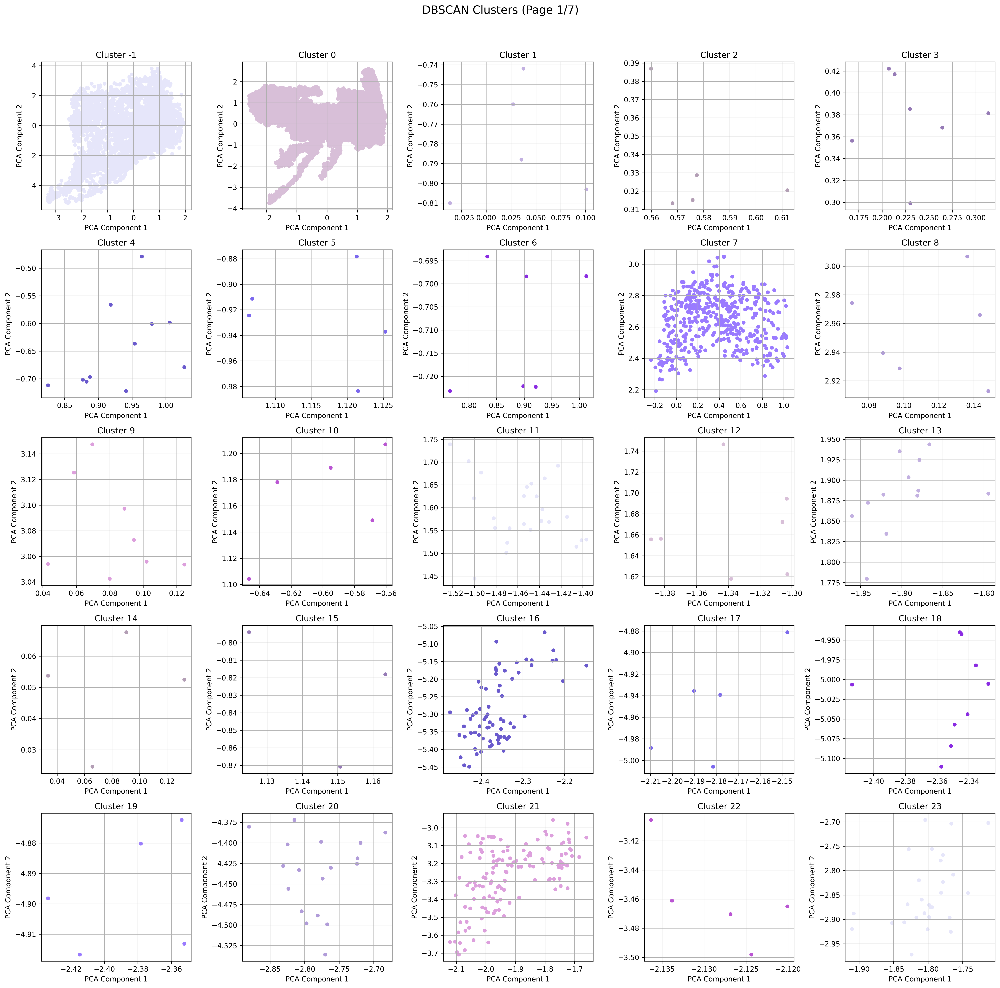

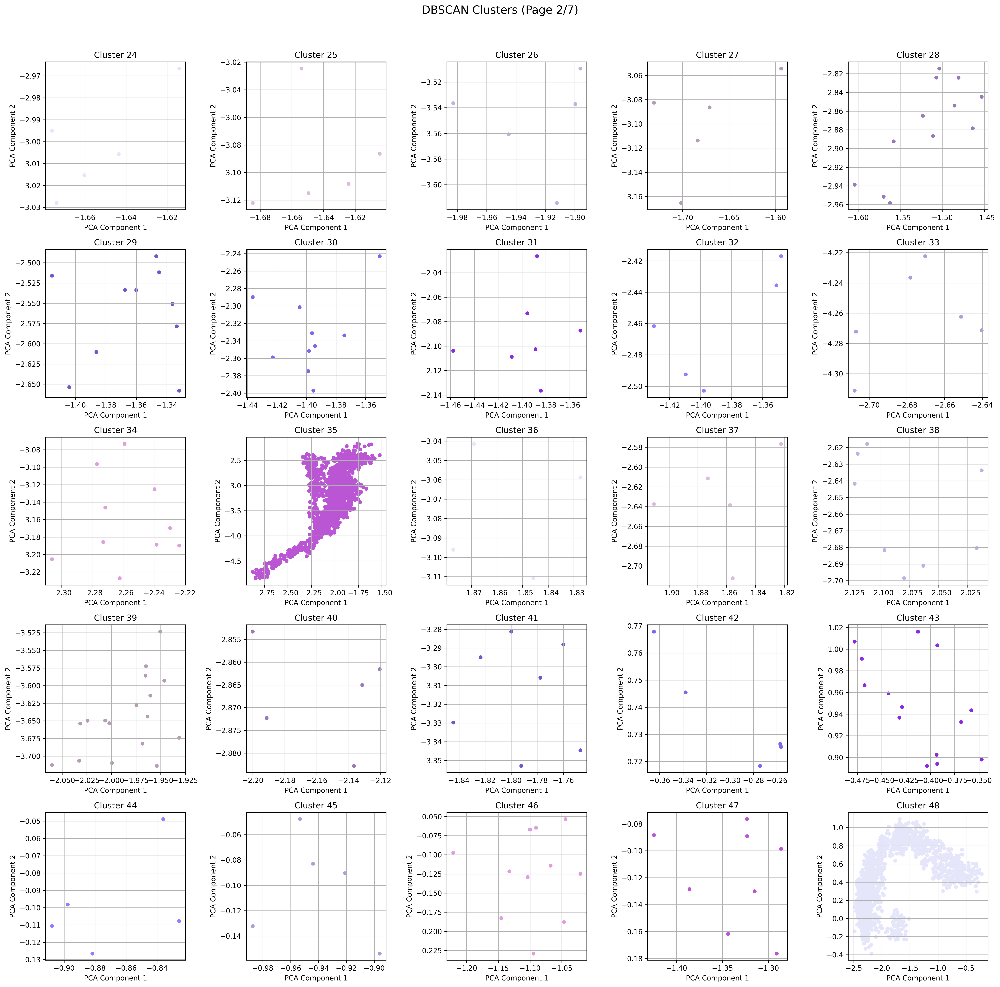

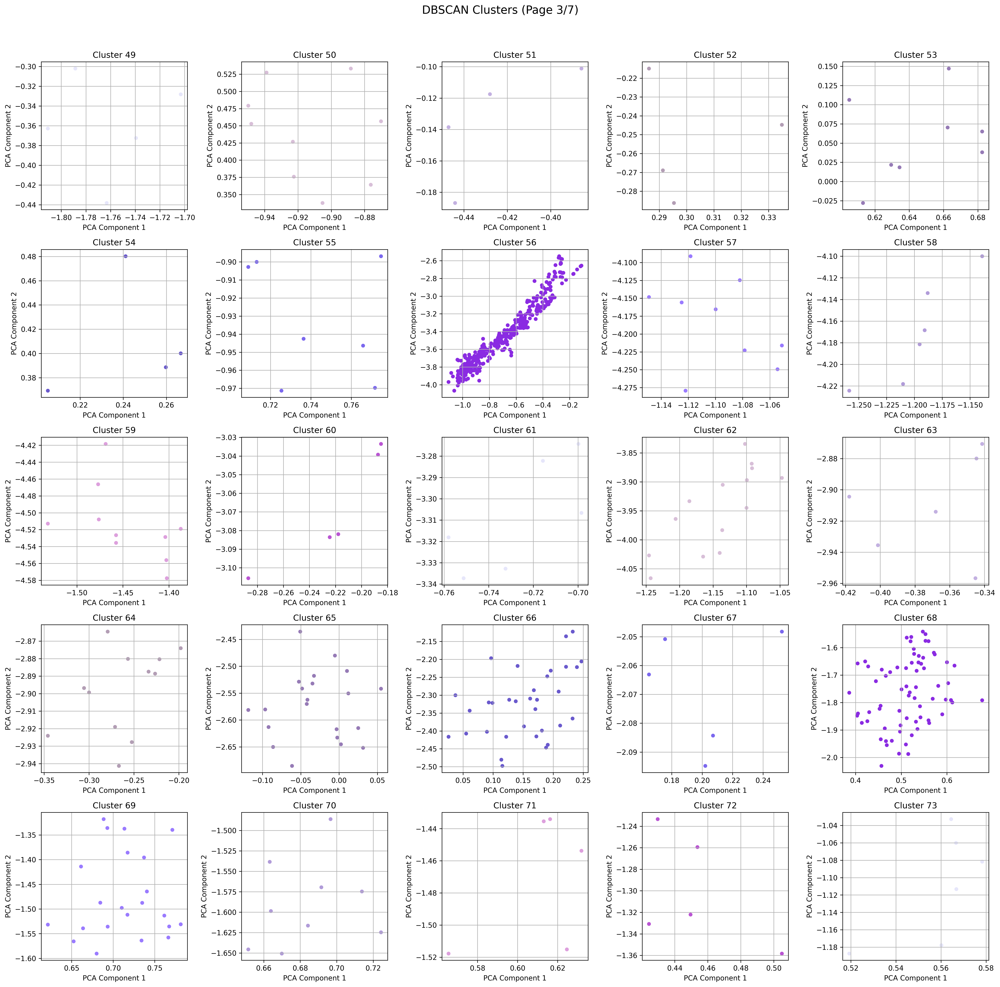

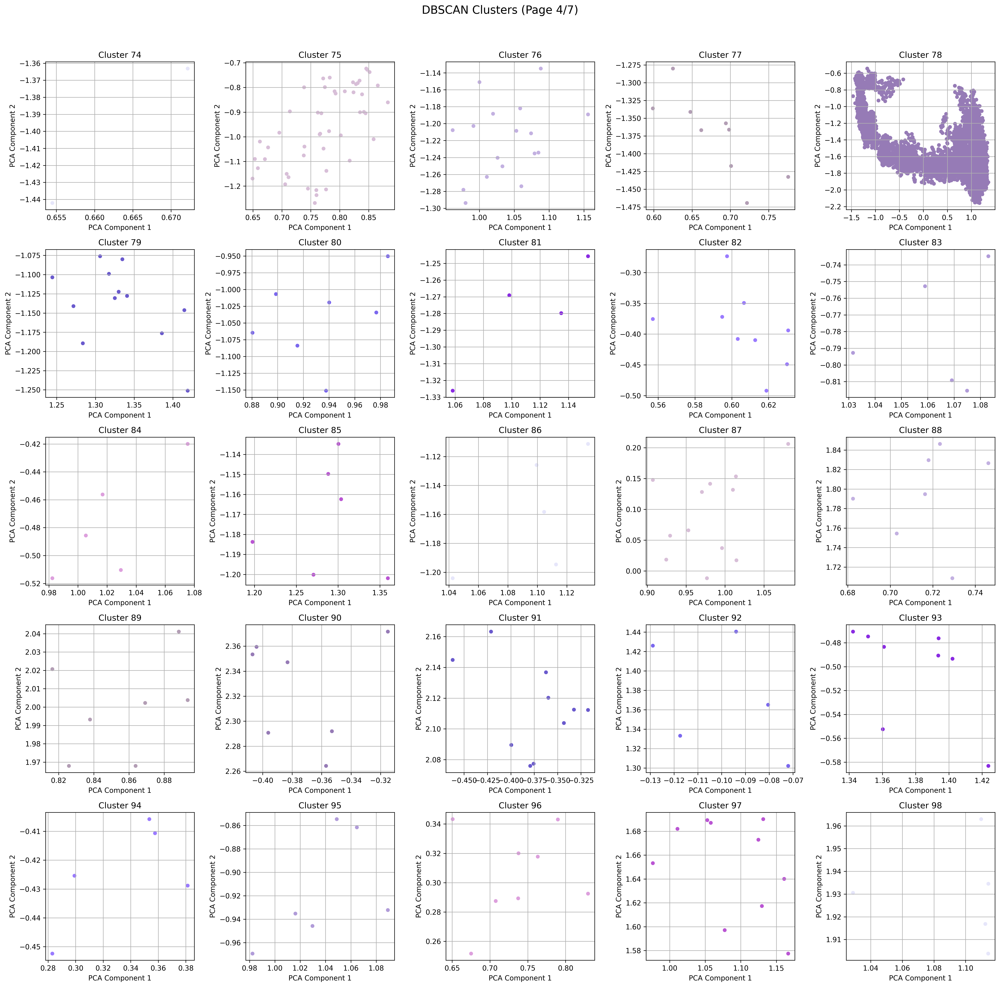

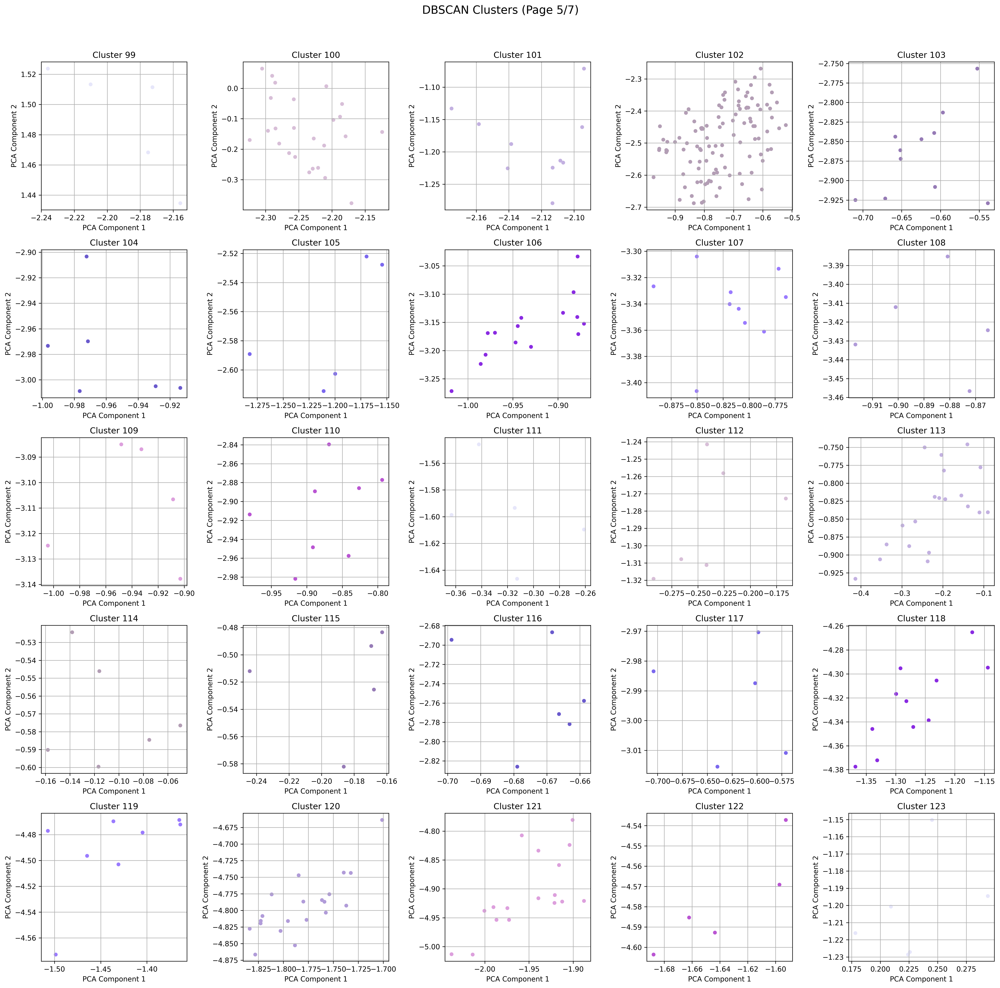

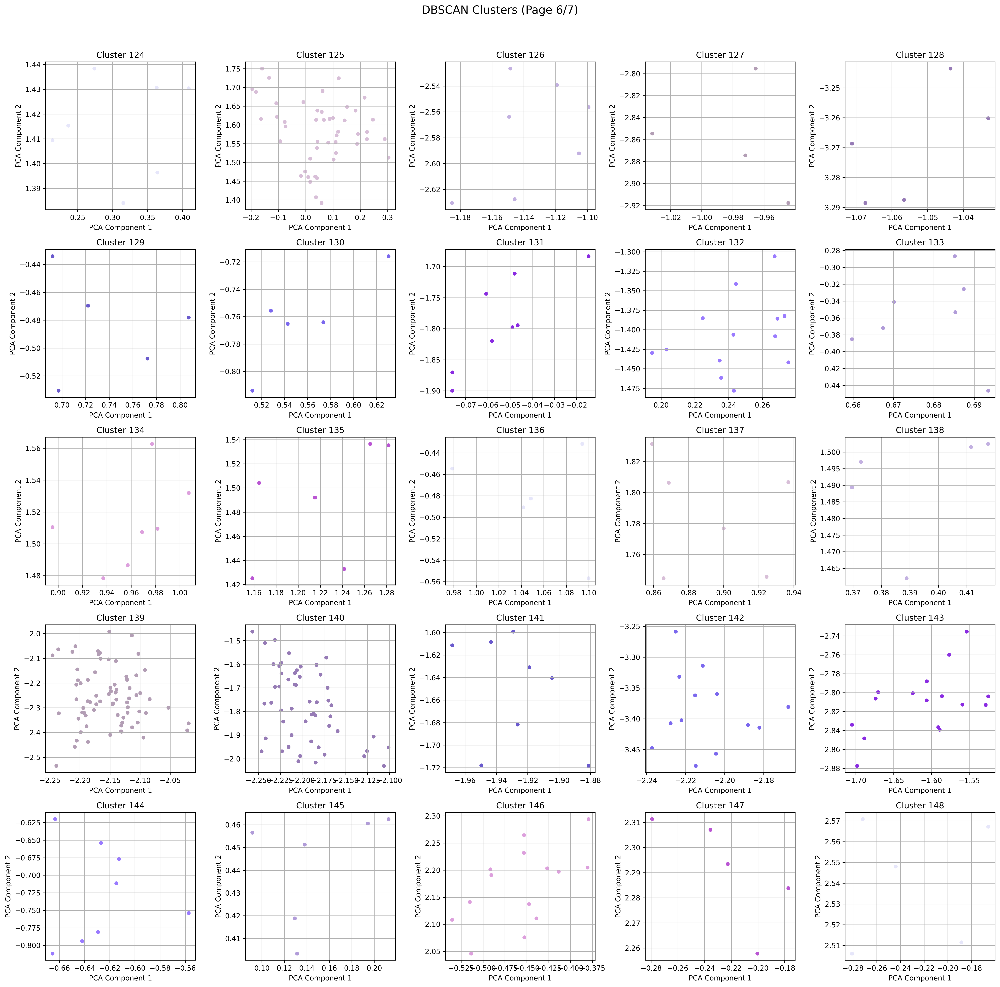

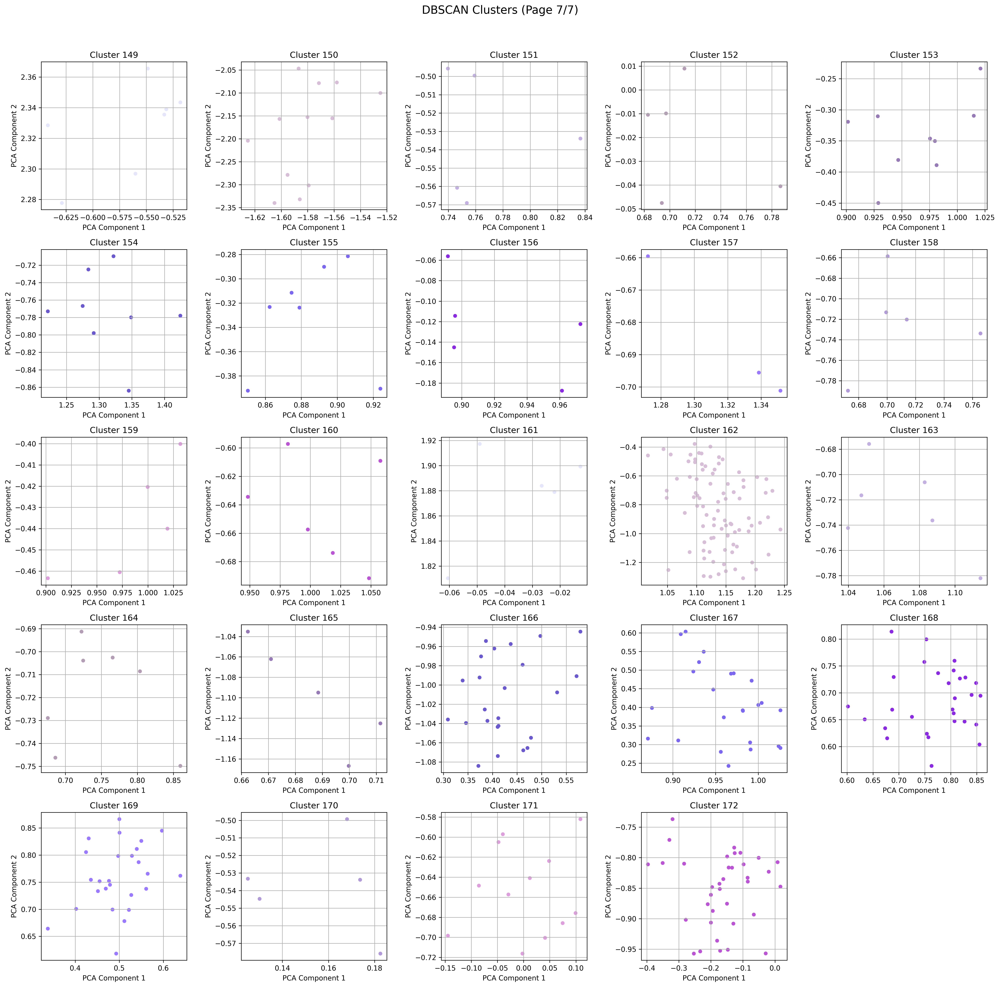

In [12]:
clusters_per_page = 25
pages = int(np.ceil(total_clusters / clusters_per_page))

lavender_palette = ['#E6E6FA', '#D8BFD8', '#C3B1E1', '#B39EB5', 
                    '#967BB6', '#6A5ACD', '#7B68EE', '#8A2BE2', 
                    '#9A7BFF', '#B19CD9', '#DDA0DD', '#BA55D3']

for page in range(pages):
    fig, axes = plt.subplots(5, 5, figsize=(20, 20), dpi=300)  # 5x5 grid per page
    axes = axes.flatten()

    start_idx = page * clusters_per_page
    end_idx = min((page + 1) * clusters_per_page, total_clusters)

    for i, cluster_label in enumerate(unique_labels[start_idx:end_idx]):
        ax = axes[i]
        cluster_points = pca_features[dbscan_labels == cluster_label]
        color = lavender_palette[i % len(lavender_palette)]
        ax.scatter(cluster_points[:, 0], cluster_points[:, 1], s=20, color=color)
        ax.set_title(f"Cluster {cluster_label}", fontsize=12)
        ax.set_xlabel("PCA Component 1")
        ax.set_ylabel("PCA Component 2")
        ax.grid(True)

    # Hide unused axes if this is the last page and has fewer than 25 clusters
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.suptitle(f"DBSCAN Clusters (Page {page+1}/{pages})", fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.savefig('dbscan_clusters {page}.png', dpi=300, bbox_inches='tight')


    plt.show()


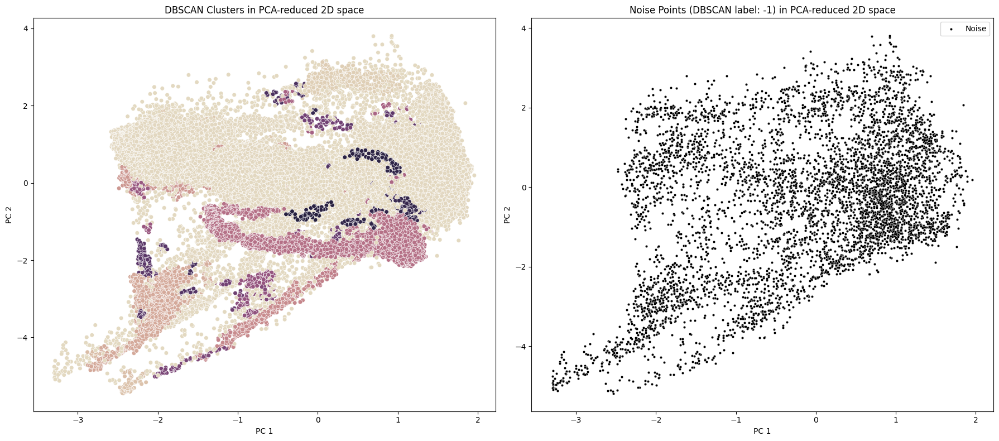

In [19]:
# Create a 1x2 grid of subplots (two columns, one row)
fig, axes = plt.subplots(1, 2, figsize=(18, 8))

# 1. Plotting DBSCAN Clusters in PCA-reduced 2D space (first subplot)
sns.scatterplot(x=pca_features[:, 0], y=pca_features[:, 1], hue=dbscan.labels_, palette="ch:s=-.2,r=.6", s=30, legend='auto', ax=axes[0])

# Titles and labels for the first subplot
axes[0].set_title('DBSCAN Clusters in PCA-reduced 2D space')
axes[0].set_xlabel('PC 1')
axes[0].set_ylabel('PC 2')

# Remove legend to make space for colorbar
axes[0].legend([], [], frameon=False)

# 2. Filter the noise points (dbscan_labels == -1)
noise_points = dbscan.labels_ == -1
features_2d_noise = pca_features[noise_points]

# Plotting noise points in the second subplot
sns.scatterplot(x=features_2d_noise[:, 0], y=features_2d_noise[:, 1], color='black', label='Noise', s=10, ax=axes[1])

# Titles and labels for the second subplot
axes[1].set_title('Noise Points (DBSCAN label: -1) in PCA-reduced 2D space')
axes[1].set_xlabel('PC 1')
axes[1].set_ylabel('PC 2')

plt.savefig('dbscan_clusters_combined.png', dpi=300, bbox_inches='tight')


# Show the plot
plt.tight_layout()  # Adjust layout for better spacing
plt.show()

In [10]:
from sklearn.metrics import pairwise_distances

def compute_dbscan_cluster_centroids(features, labels):
    centroids = {}
    unique_labels = np.unique(labels)

    for cluster_label in unique_labels:
        cluster_points = features[labels == cluster_label]
        centroid = np.mean(cluster_points, axis=0)
        centroids[cluster_label] = centroid
    return centroids

def find_most_representative_dbscan_samples(features, labels, file_paths, target_clusters, n_samples=5):
    centroids = compute_dbscan_cluster_centroids(features, labels)

    representative_samples = {}

    for cluster_label in target_clusters:
        if cluster_label not in centroids:
            print(f"Warning: Cluster {cluster_label} does not exist. Skipping.")
            continue
        
        cluster_indices = np.where(labels == cluster_label)[0]
        cluster_features = features[cluster_indices]
        cluster_files = [file_paths[i] for i in cluster_indices]

        # Compute distance to centroid
        centroid = centroids[cluster_label].reshape(1, -1)
        distances = pairwise_distances(cluster_features, centroid, metric='euclidean')

        # Sort and select top 5 closest samples
        sorted_indices = np.argsort(distances.ravel())[:n_samples]
        representative_samples[cluster_label] = [cluster_files[i] for i in sorted_indices]

    return representative_samples

def plot_melspec_and_play(audio_file, ax):
    # Load audio
    y, sr = librosa.load(audio_file, sr=None)

    # Compute mel spectrogram
    melspec = librosa.feature.melspectrogram(y=y, sr=sr, n_mels=128)
    melspec_db = librosa.power_to_db(melspec, ref=np.max)

    # Plot mel spectrogram
    librosa.display.specshow(melspec_db, sr=sr, x_axis='time', y_axis='mel', ax=ax)
    ax.set_title(f'Mel Spectrogram\n{os.path.basename(audio_file)}', fontsize=10)

    # Play audio (for Jupyter or IPython environments)
    display(ipd.Audio(audio_file))

def display_representative_dbscan_samples(features, labels, file_paths, target_clusters=None, n_samples=5):
    # Default to all clusters if target_clusters not provided
    if target_clusters is None:
        target_clusters = [label for label in np.unique(labels) if label != -1]

    representative_samples = find_most_representative_dbscan_samples(features, labels, file_paths, target_clusters, n_samples)

    for cluster_label, files in representative_samples.items():
        print(f"\nDBSCAN Cluster {cluster_label}: Most Representative Samples")
        fig, axes = plt.subplots(1, len(files), figsize=(20, 4), dpi=150)

        if len(files) == 1:
            axes = [axes]

        for i, file in enumerate(files):
            print(f"  - {file}")
            plot_melspec_and_play(file, axes[i])

        plt.suptitle(f"DBSCAN Cluster {cluster_label} - Most Representative Samples", fontsize=14)
        plt.tight_layout()
        plt.show()



DBSCAN Cluster 7: Most Representative Samples
  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20181002_000000_segment_6416.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20181001_000000_segment_6411.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20181002_000000_segment_6422.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20181002_000000_segment_6404.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20181001_000000_segment_6446.wav


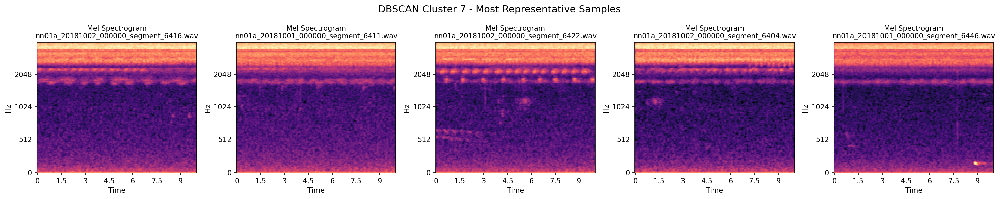


DBSCAN Cluster 35: Most Representative Samples
  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20181005_000000_segment_7923.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20181005_000000_segment_7932.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20181005_000000_segment_8378.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20181006_000000_segment_344.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20181005_000000_segment_7925.wav


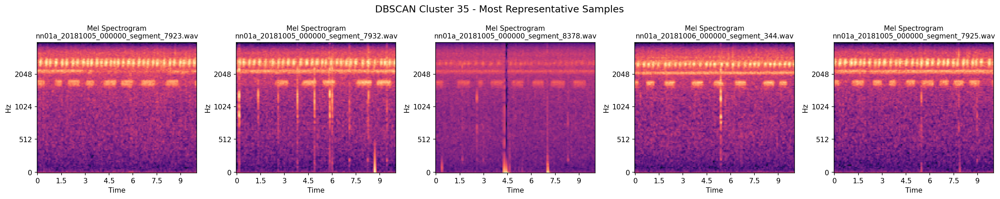


DBSCAN Cluster 56: Most Representative Samples
  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20181001_000000_segment_4188.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20181001_000000_segment_4195.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20181001_000000_segment_4169.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20181001_000000_segment_4172.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20181001_000000_segment_4199.wav


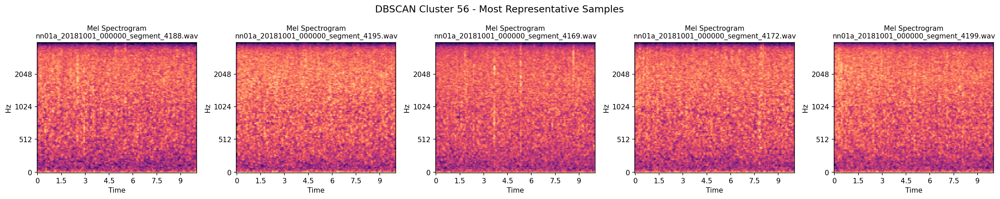


DBSCAN Cluster 75: Most Representative Samples
  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20181001_000000_segment_4604.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20181001_000000_segment_4602.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20181001_000000_segment_4637.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20181001_000000_segment_4606.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20181001_000000_segment_4630.wav


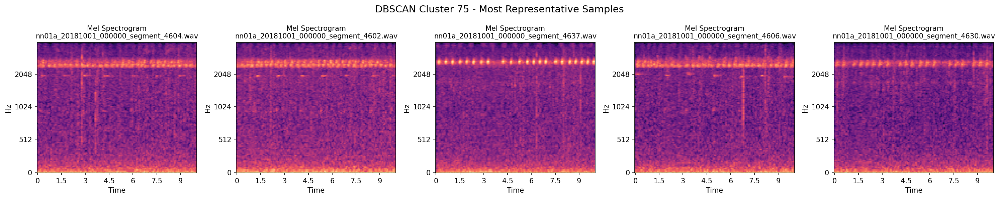

In [17]:
display_representative_dbscan_samples(selected_features, dbscan_labels, audio_files, target_clusters=[7, 35, 56, 75])

In [18]:
selected_samples = find_most_representative_dbscan_samples(selected_features, dbscan_labels, audio_files, n_samples=5, target_clusters=[7, 35, 56, 75])

In [19]:
def compute_shannon_index(audio, sr, n_fft=1024, hop_length=512):
    S = np.abs(librosa.stft(audio, n_fft=n_fft, hop_length=hop_length))**2
    energy_per_band = np.sum(S, axis=1)
    total_energy = np.sum(energy_per_band)
    proportions = energy_per_band / total_energy
    proportions = proportions[proportions > 0]  # Avoid log(0) errors
    shannon_index = -np.sum(proportions * np.log(proportions))
    return shannon_index

# Store results
shannon_results = []

# Loop through each cluster and its files
for cluster_label, files in selected_samples.items():
    for file_path in files:
        audio, sr = librosa.load(file_path, sr=None)
        shannon_index = compute_shannon_index(audio, sr)

        shannon_results.append({
            "filename": file_path,
            "cluster_label": cluster_label,
            "shannon_index": shannon_index
        })

# Convert results to DataFrame
shannon_df = pd.DataFrame(shannon_results)

# Save results to CSV
shannon_df.to_csv("dbscan_shannon_indices_per_cluster.csv", index=False)

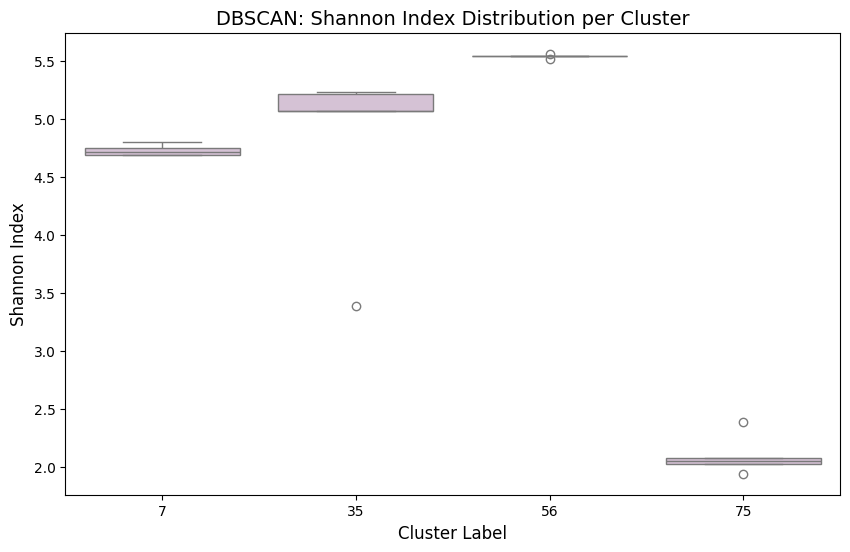

In [20]:
plt.figure(figsize=(10, 6))

# Use seaborn for color control (matplotlib boxplot itself is tricky with colors)
sns.boxplot(x='cluster_label', y='shannon_index', data=shannon_df, color='thistle')  # 'thistle' is a nice lavender

plt.title("DBSCAN: Shannon Index Distribution per Cluster", fontsize=14)
plt.xlabel("Cluster Label", fontsize=12)
plt.ylabel("Shannon Index", fontsize=12)
plt.grid(False)
plt.show()
plt.show()

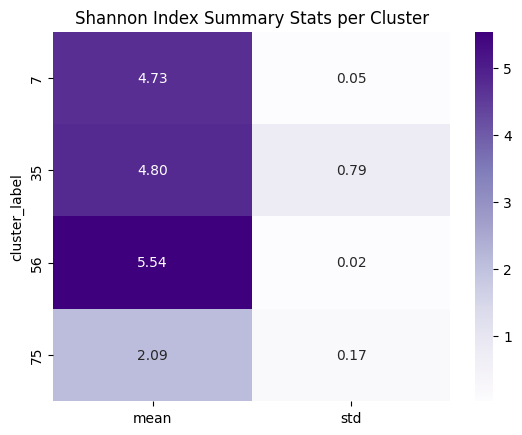

In [21]:
summary = shannon_df.groupby('cluster_label')['shannon_index'].agg(['mean', 'std']).reset_index()
sns.heatmap(summary.set_index('cluster_label'), annot=True, cmap='Purples', fmt=".2f")
plt.title("Shannon Index Summary Stats per Cluster")
plt.show()


C:\Users\alina\AppData\Local\Temp\ipykernel_15384\2571486921.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='cluster_label', y='shannon_index', data=shannon_df, palette='Purples')


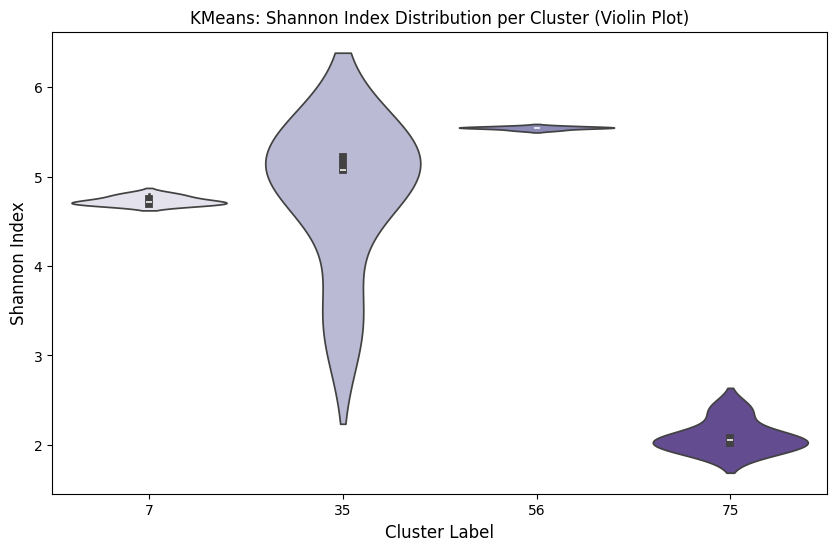

In [22]:
plt.figure(figsize=(10, 6))

sns.violinplot(x='cluster_label', y='shannon_index', data=shannon_df, palette='Purples')
plt.title('KMeans: Shannon Index Distribution per Cluster (Violin Plot)', fontsize=12)
plt.xlabel('Cluster Label', fontsize=12)
plt.ylabel('Shannon Index', fontsize=12)
plt.show()